## _**Raymond Jennings**_
## Fuzzy-C-Means with GeoPandas to show reported crimes in NYC on New Year's Eve 2021

<br>

#### Part 2. _Fuzzy-C-Means_ using python package _fcmeans_


# **_Fuzzy-C-Means:_**

### Computing the new weight values

$\Large M_{ij} = \frac{\frac{1}{dist(p_i, c_j)^2}^{\frac{1}{p-1}}}{\sum \limits _{q=1} ^ {k}\frac{1}{dist(p_i,c_q)^2}^{\frac{1}{p-1}}}$

<br>

### Computing the new centroids

$\Large c_{j} = \frac{\sum \limits _{i=1} ^ {n}M _{ij} ^ p x_{i}}{\sum \limits _{i=1} ^ {n}M _{ij} ^ p}$

<br>

In [1]:
!export PATH=/Library/TeX/texbin:$PATH

In [6]:
import pandas as pd
import numpy as np
import time

from sklearn.neighbors import NearestCentroid
from fcmeans import FCM

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D
from matplotlib import cm
from matplotlib.colors import ListedColormap

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd

In [7]:
df = pd.read_csv(r'./nyc_crime_newyears_eve_2021.csv')

# Swap longitude and latitude so that it works with geopandas
df.rename(columns={"Latitude": "longitude", "Longitude": "latitude"}, inplace=True)
df.rename(columns={"longitude": "Longitude", "latitude": "Latitude"}, inplace=True)
df.head()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,JURIS_DESC,...,PARKS_NM,PD_CD,PD_DESC,PREM_TYP_DESC,RPT_DT,X_COORD_CD,Y_COORD_CD,Longitude,Latitude,Lat_Lon
0,343492252,44,BRONX,12/31/2021,4:20:00,NaN,NaN,COMPLETED,NaN,N.Y. POLICE DEPT,...,NaN,101.0,ASSAULT 3,RESIDENCE - APT. HOUSE,12/31/2021,1006717,244842,40.838690,-73.918806,"(40.838689661000046, -73.91880635699994)"
1,237523345,105,QUEENS,12/31/2021,20:57:00,12/31/2021,20:57:00,COMPLETED,NaN,N.Y. POLICE DEPT,...,NaN,729.0,"FORGERY,ETC.,UNCLASSIFIED-FELO",STREET,12/31/2021,1057738,204079,40.726529,-73.734865,"(40.72652937700008, -73.73486453799995)"
2,495496948,52,BRONX,12/31/2021,4:52:00,12/31/2021,10:38:00,COMPLETED,NaN,N.Y. POLICE DEPT,...,NaN,639.0,AGGRAVATED HARASSMENT 2,RESIDENCE - APT. HOUSE,12/31/2021,1019141,259102,40.877789,-73.873832,"(40.87778870600005, -73.87383219999998)"
3,822360567,88,BROOKLYN,12/31/2021,14:15:00,12/31/2021,14:25:00,COMPLETED,NaN,N.Y. POLICE DEPT,...,NaN,343.0,"LARCENY,PETIT OF BICYCLE",RESIDENCE - APT. HOUSE,12/31/2021,990275,189696,40.687355,-73.978277,"(40.68735463300004, -73.97827668799994)"
4,330713178,42,BRONX,12/31/2021,19:15:00,12/31/2021,19:20:00,COMPLETED,NaN,N.Y. POLICE DEPT,...,NaN,101.0,ASSAULT 3,STREET,12/31/2021,1012188,245084,40.839338,-73.899033,"(40.83933826800006, -73.89903332699998)"


In [8]:
#
# Make dataframe variable with the Longitude and Latitude columns only and numpy array
#
X = df.loc[:,['Latitude','Longitude']]
Y = X.to_numpy()

Run time: 0.16163649099999589
Partition Coefficient: 0.045480831285246284
Partition Entropy Coefficient: 0.44691910853641403


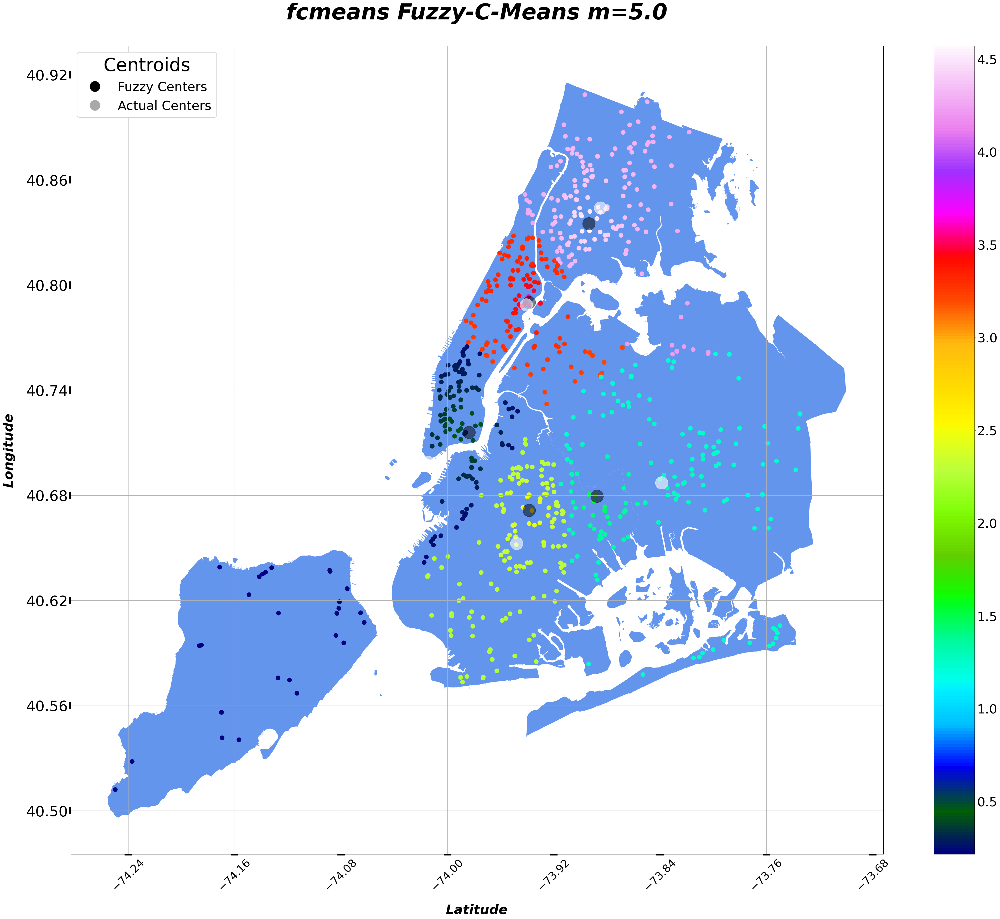





Run time: 0.13086346599999388
Partition Coefficient: 0.050927088719573396
Partition Entropy Coefficient: 0.431374073892941


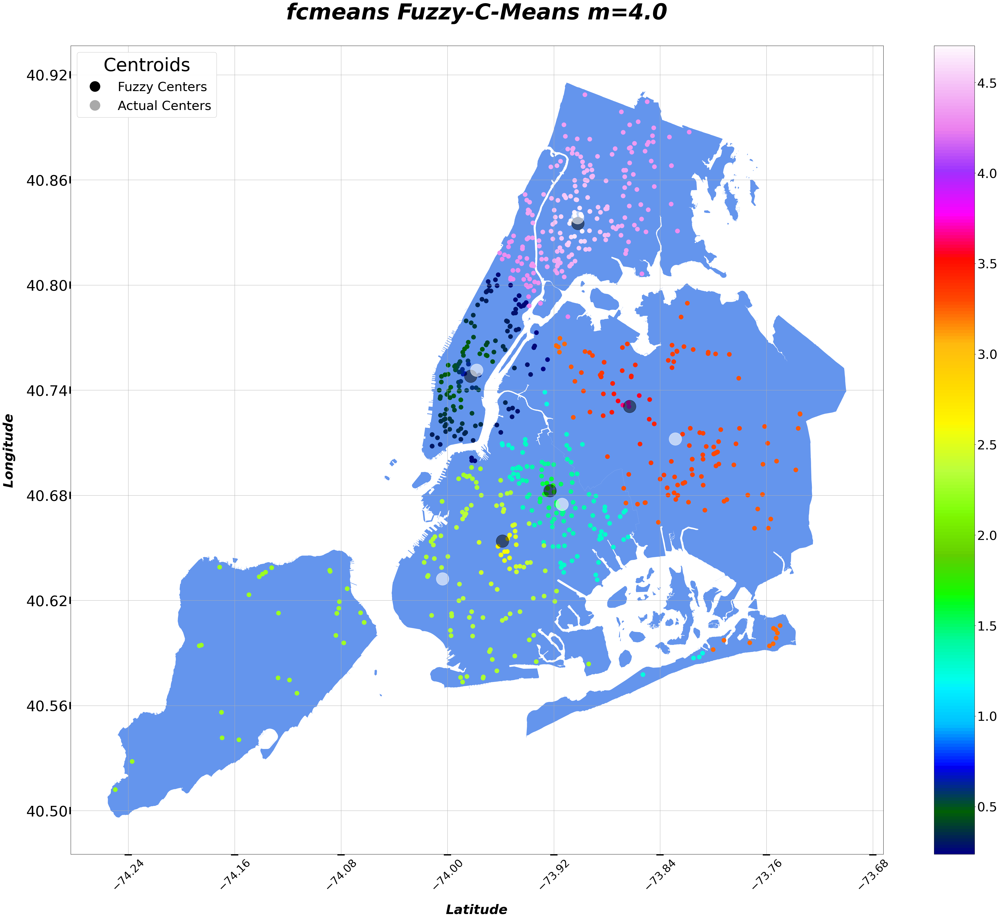





Run time: 0.11268218899999738
Partition Coefficient: 0.06816550725936937
Partition Entropy Coefficient: 0.3830022688803403


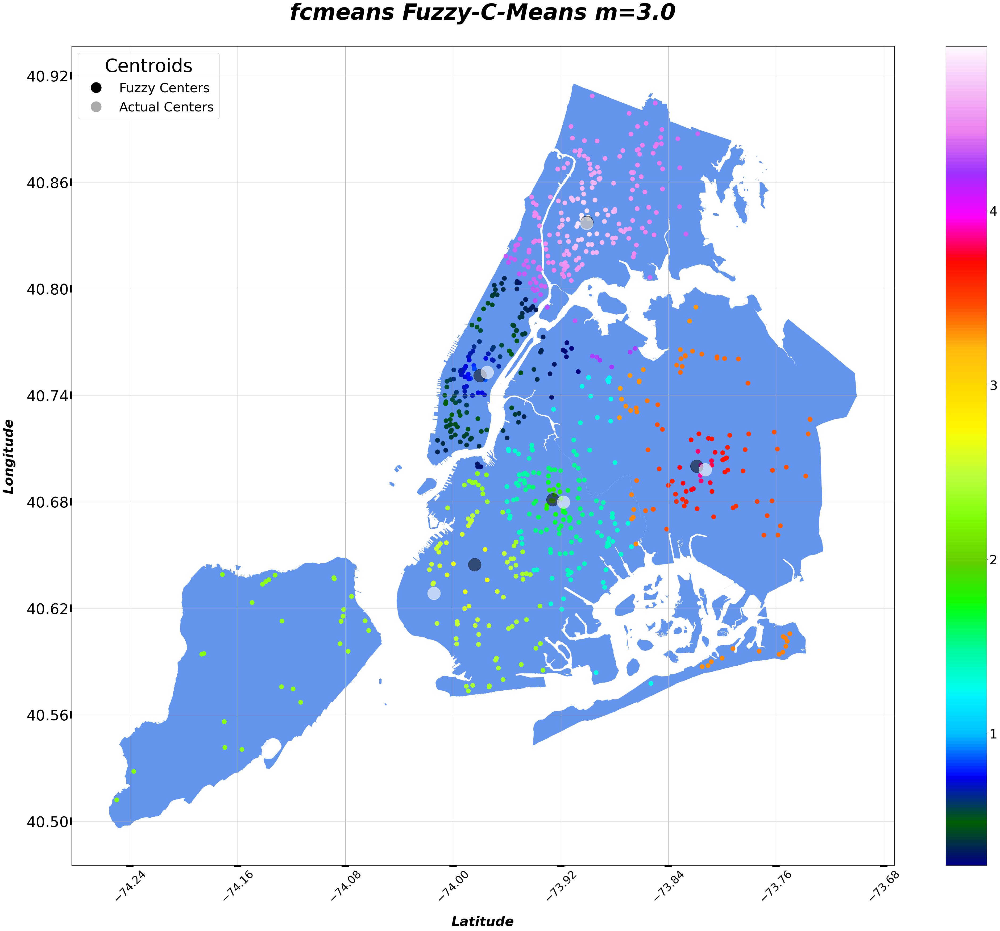





Run time: 0.17142612300000337
Partition Coefficient: 0.09267368992250925
Partition Entropy Coefficient: 0.31485471462505554


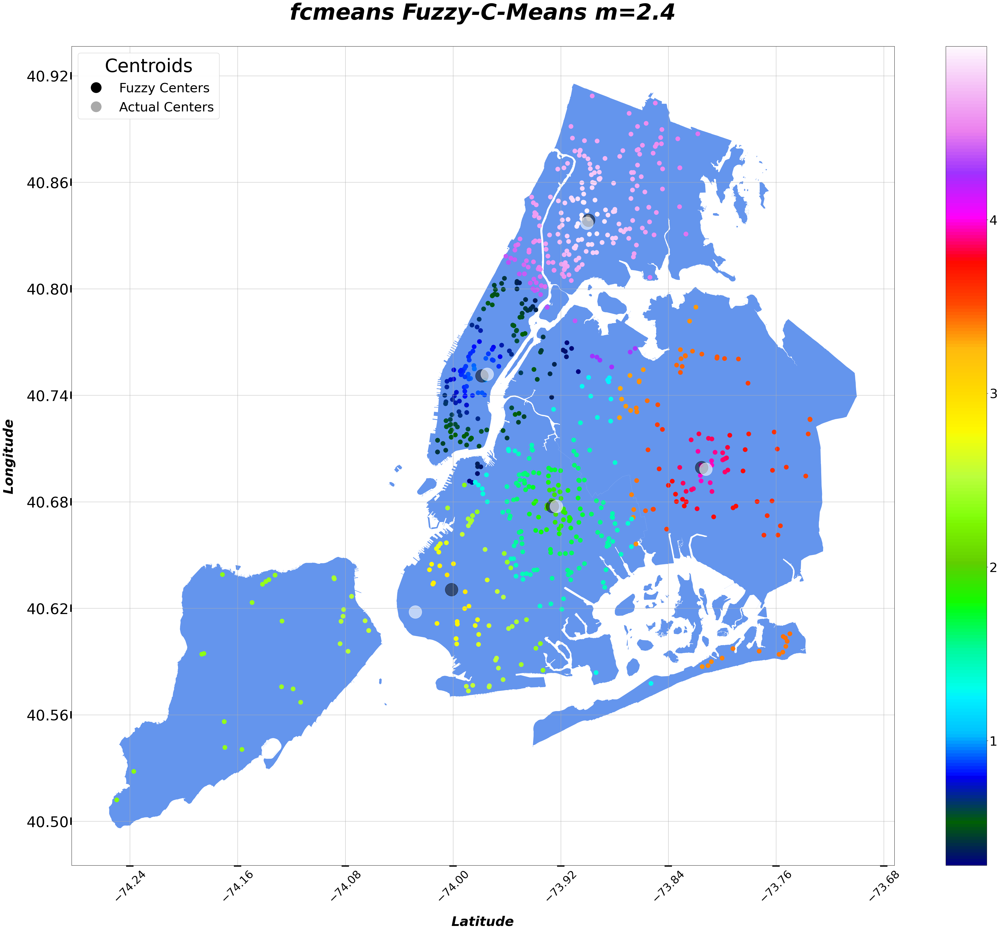





Run time: 0.0766248580000024
Partition Coefficient: 0.09854072896719288
Partition Entropy Coefficient: 0.29826257119307087


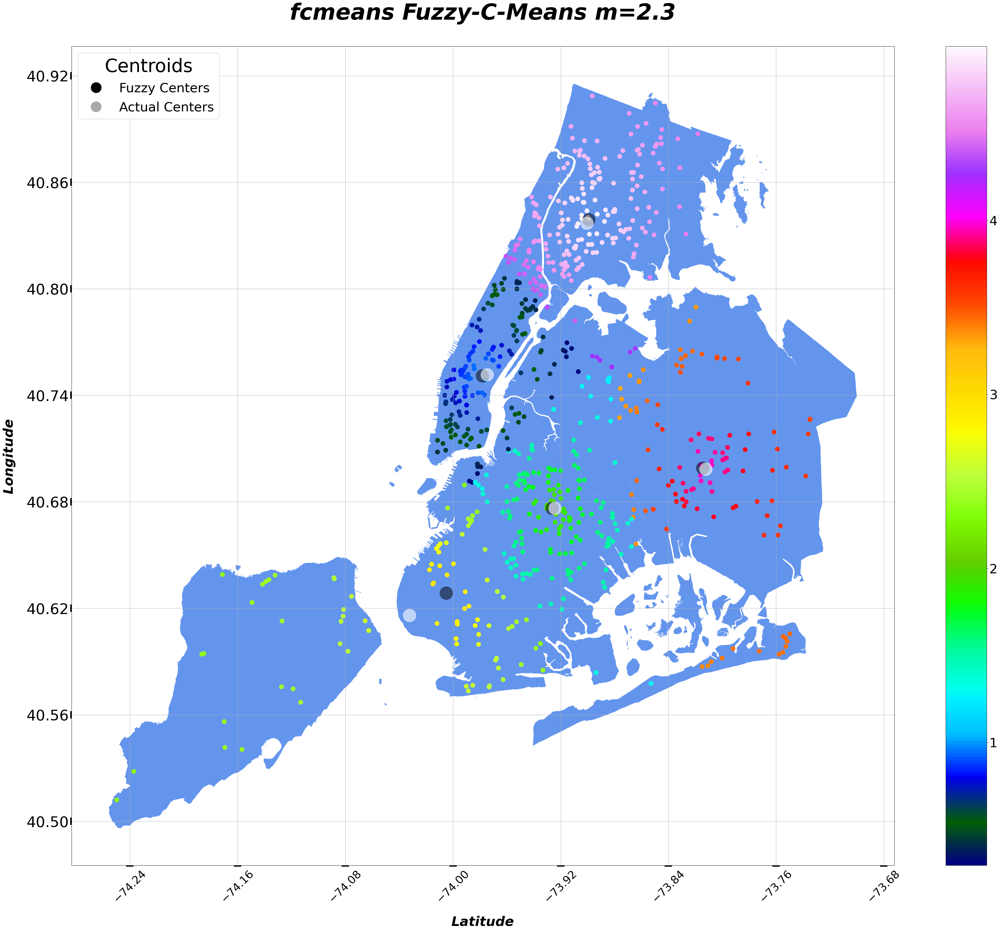





Run time: 0.08773450200001776
Partition Coefficient: 0.10507178662113734
Partition Entropy Coefficient: 0.2796339772217784


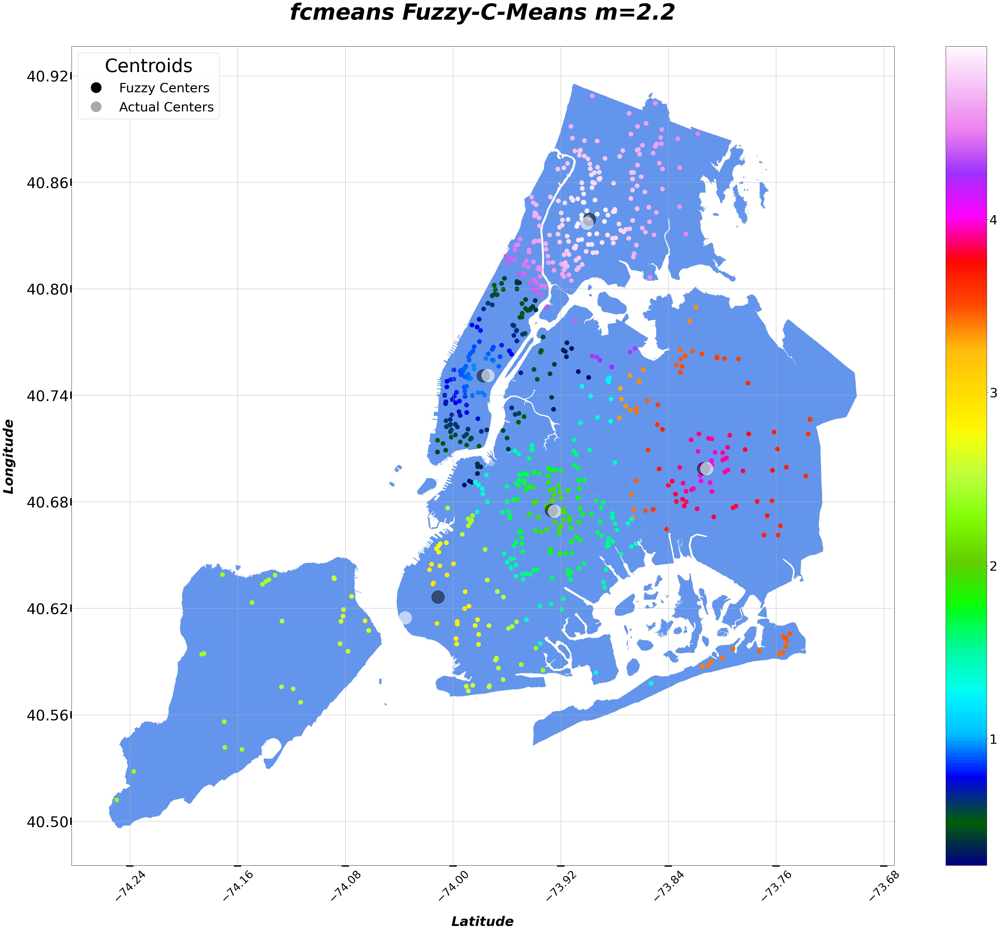





Run time: 0.09648035500001129
Partition Coefficient: 0.11564291900378217
Partition Entropy Coefficient: 0.24869521293587052


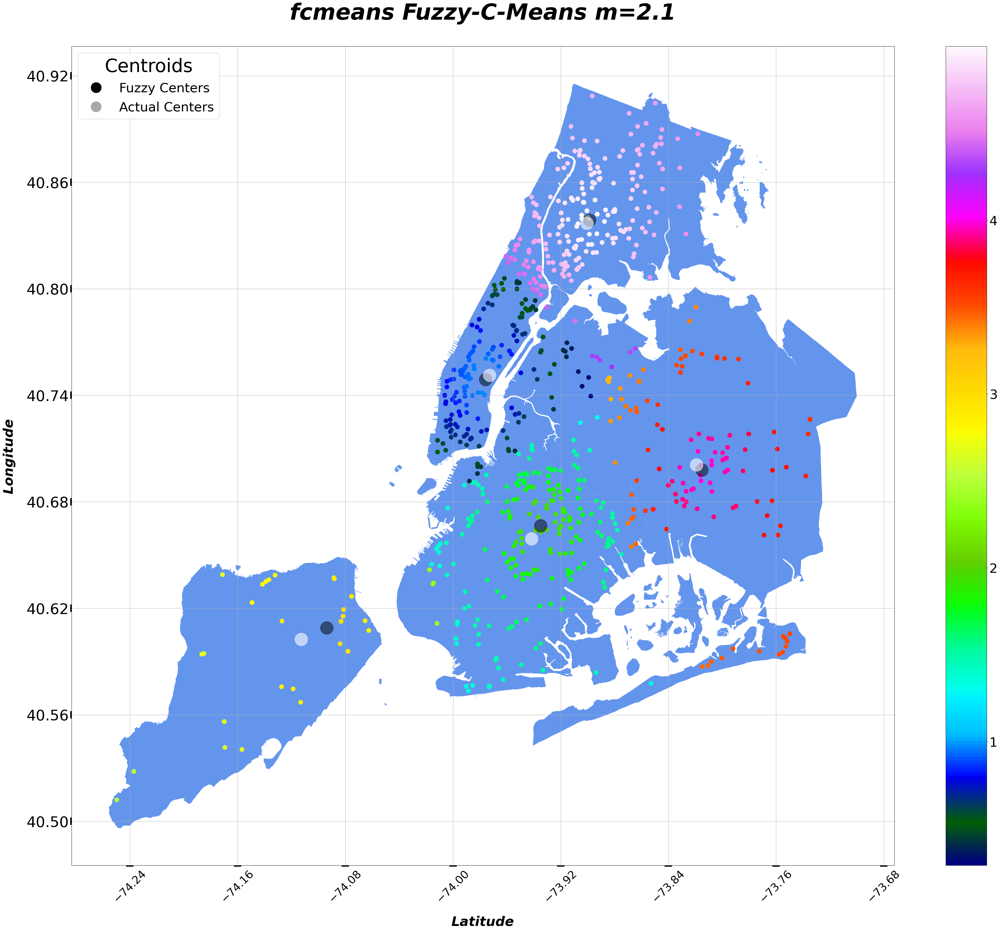





Run time: 0.05825684499998829
Partition Coefficient: 0.12362031849677077
Partition Entropy Coefficient: 0.22524790772780684


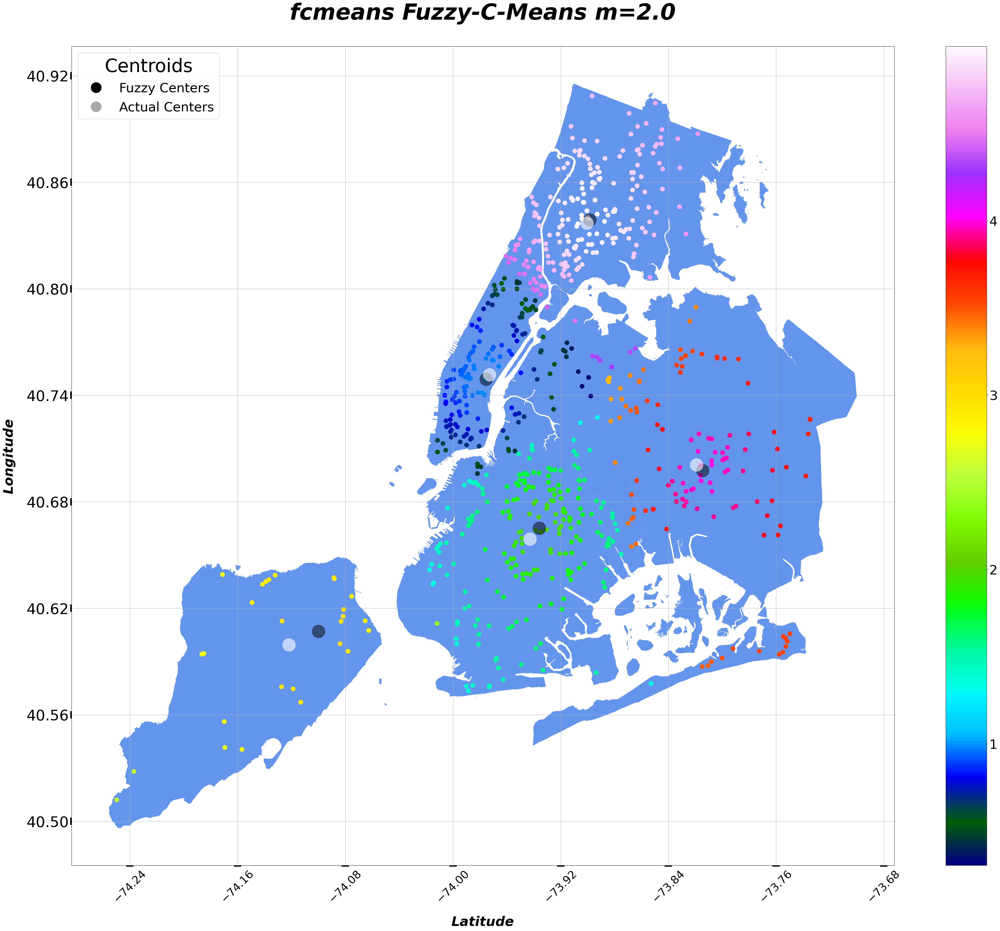





Run time: 0.06836229900000035
Partition Coefficient: 0.13210001424290496
Partition Entropy Coefficient: 0.19994429889209417


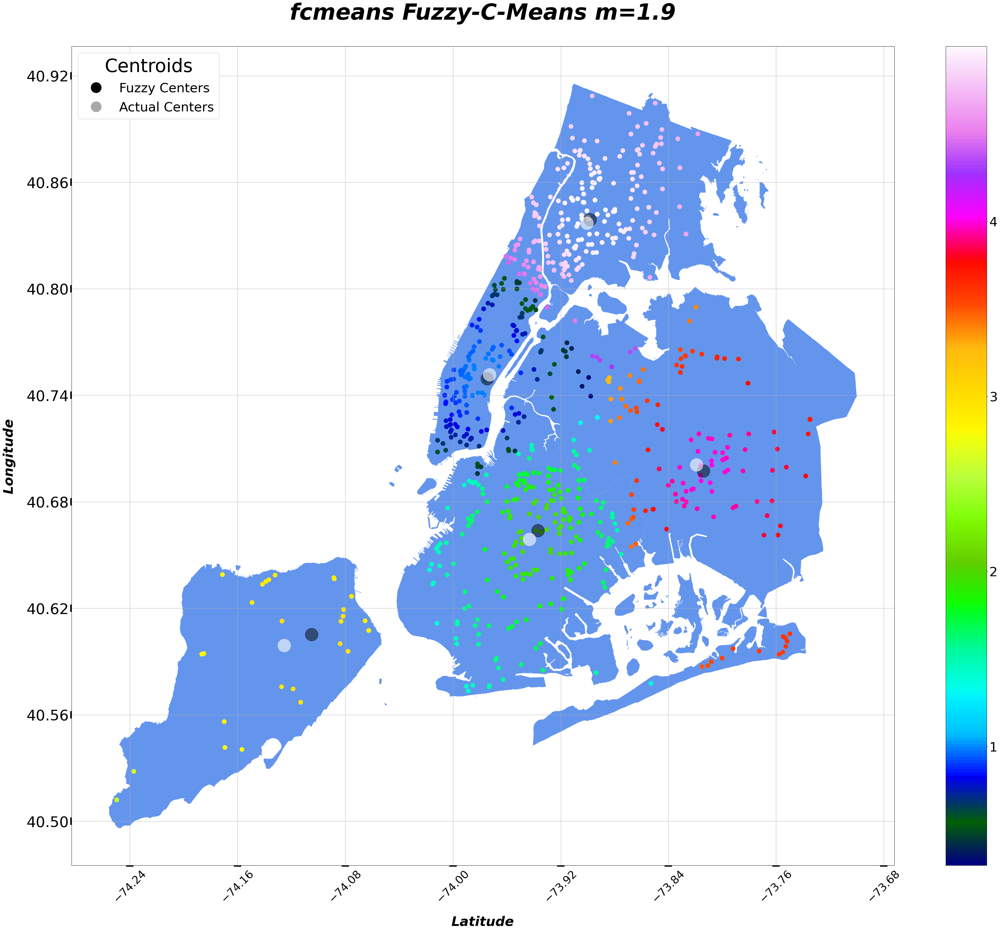





Run time: 0.06926885999999399
Partition Coefficient: 0.15000946965411796
Partition Entropy Coefficient: 0.1453106712434012


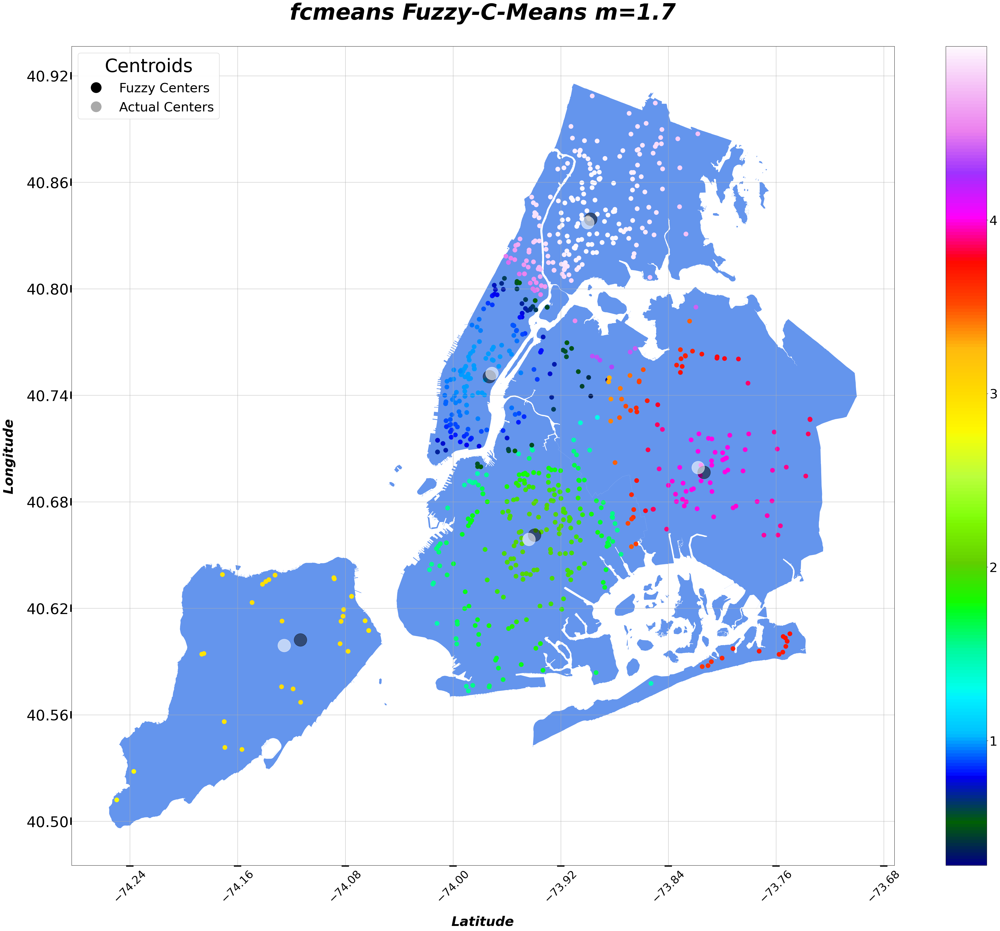





Run time: 0.1619924889999993
Partition Coefficient: 0.16791862090694665
Partition Entropy Coefficient: 0.09004449871665975


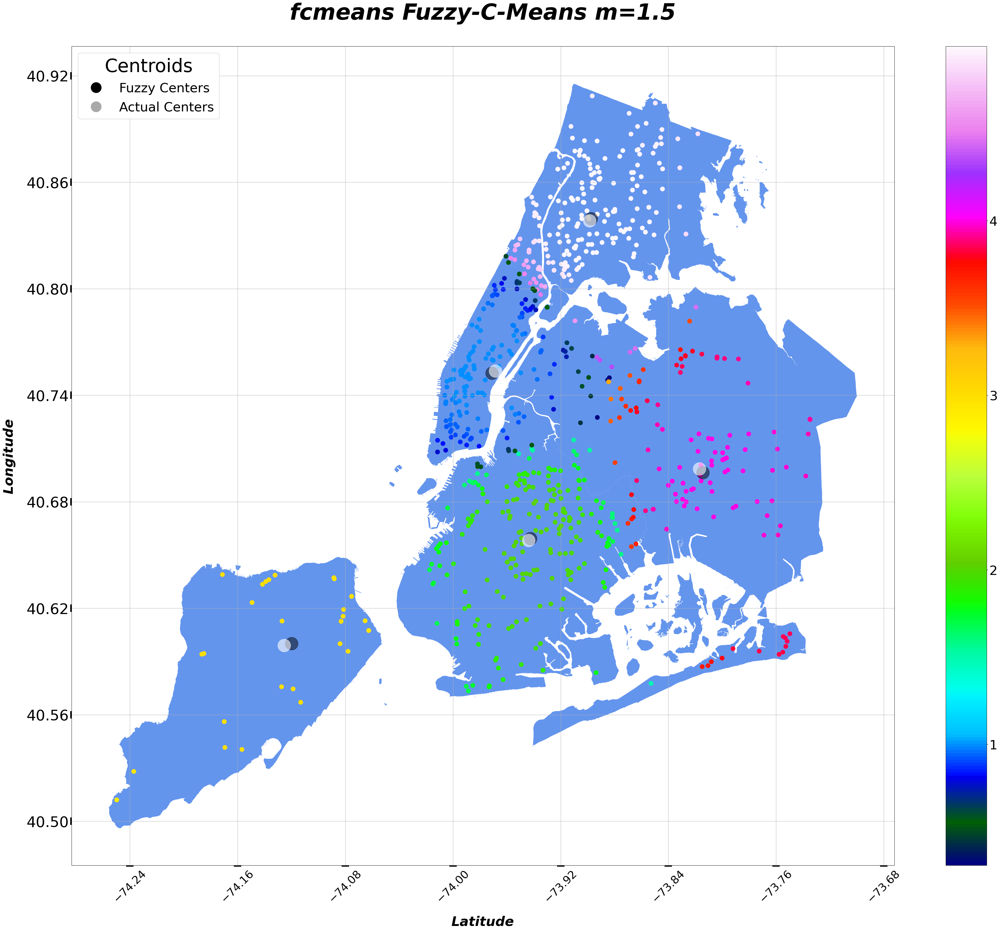





Run time: 0.05868643200000179
Partition Coefficient: 0.18350159577513608
Partition Entropy Coefficient: 0.04334353572651248


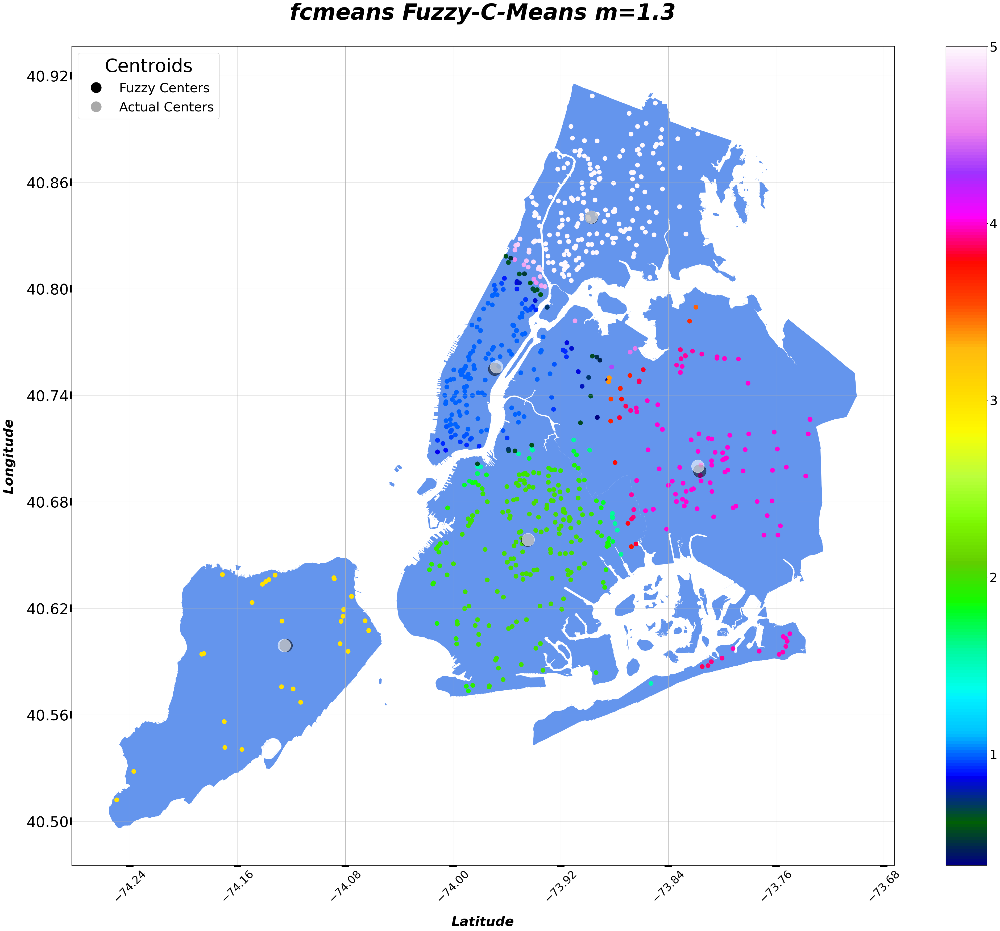





Run time: 0.06856182699999636
Partition Coefficient: 0.19441115369101242
Partition Entropy Coefficient: 0.013080527724414577


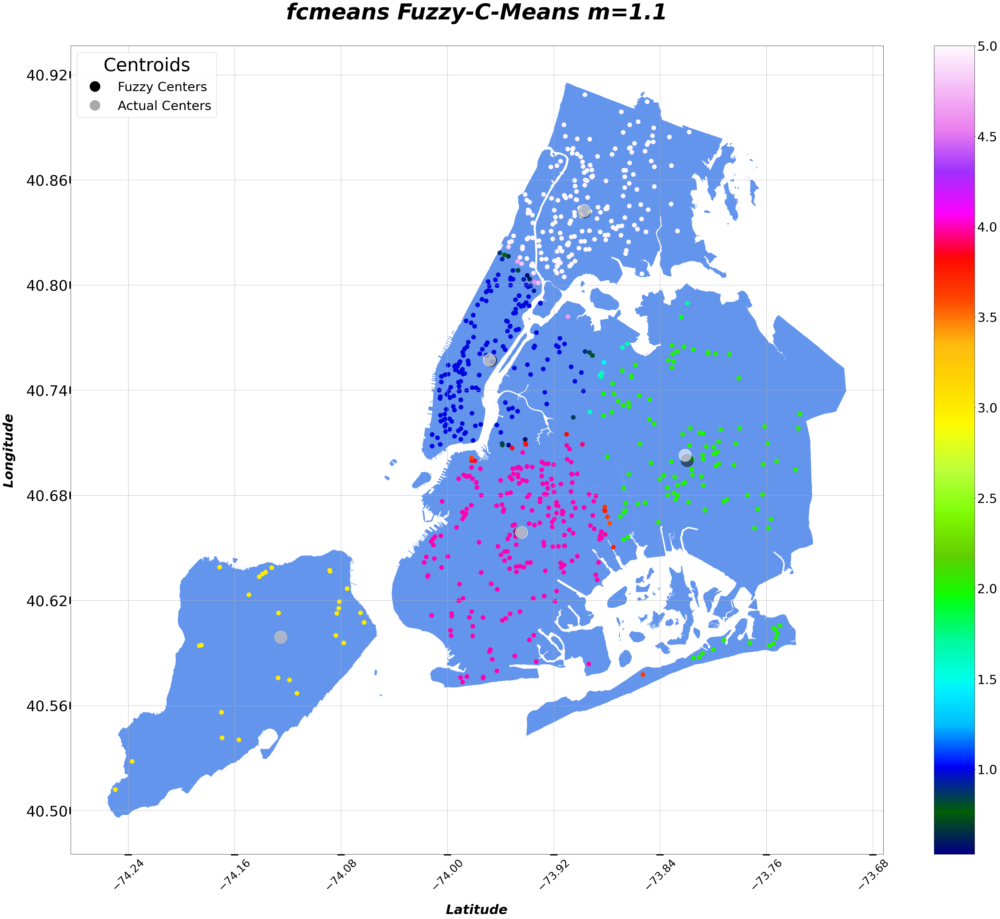

In [9]:
# Flag if print version of plot is needed
_print = False

#
# Create colormap for geopandas to not collide with the gist_ncar cmap
#
if _print:
    geo_cmap = ListedColormap(['lightcyan'], name='lightcyan')
else:
    geo_cmap = ListedColormap(['cornflowerblue'], name='cornflowerblue')
    
#
# Set values of m to iterate over for Fuzzy-C-Means
#
m_range = [5.0, 4.0, 3.0, 2.4, 2.3, 2.2, 2.1, 2.0, 1.9, 1.7, 1.5, 1.3, 1.1]

for m in m_range:

    start_time = time.perf_counter()
    
    fcm_model = FCM(n_clusters=5, max_iter=1000, random_state=123, m=m, error=1e-8)
    fcm_model.fit(Y)
    fcm_centers = fcm_model.centers

    #
    # These are the predictions - 5 predictions per each label value
    #   Use fcm_model.predict(Y) to get the integer class values
    #
    fcm_labels_soft = fcm_model.soft_predict(Y)
    end_time = time.perf_counter()
    
    print("Run time: ", end='')
    print(end_time - start_time)
    
    # Get non soft labels to compute actual centroids (don't count this call in the runtime)
    fcm_labels = fcm_model.predict(Y)

    #
    # Compute the cluster approximations
    #
    l = []
    for x in fcm_labels_soft:
        np_max = np.max(x)
        np_offset = np.argmax(x,axis=0)
        
        #
        # Add the offset (original cluster number) to the max-prediction per each row
        #   These values will be the "fuzzy label values"
        val = np_max + np_offset
        l.append(val)
    
    labels = np.asarray(l)

    #transformed_X = fcm_model.centers[fcm_labels]
    #print(fcm_labels)
    #print('Transformed X')
    #print(transformed_X)

    #
    # Scikit-Learn NearestCentroids of FCM label values are slightly different to the FCM centers
    #  save and show the differences in the plot
    #
    clf = NearestCentroid()
    clf.fit(X, fcm_labels)
    clf_centers = clf.centroids_

    pc = fcm_model.partition_coefficient
    pec = fcm_model.partition_entropy_coefficient
    print("Partition Coefficient: ", end='')
    print(pc)
    print("Partition Entropy Coefficient: ", end='')
    print(pec)
    
    #
    # Read NYCBB from geopandas
    #
    path = gpd.datasets.get_path('nybb')
    df2 = gpd.read_file(path)
    # Use WGS 84 (epsg:4326) as the geographic coordinate system
    df2 = df2.to_crs(epsg=4326)

    fig, ax = plt.subplots()

    title = 'fcmeans Fuzzy-C-Means m=' + str(m)

    # Main plot...
    ax.set_facecolor("white")
    df2.plot(ax=ax, figsize=(35, 20), cmap=geo_cmap)
    X.plot.scatter(x = 'Latitude', y = 'Longitude', c=labels, s=140, cmap='gist_ncar', ax=ax, figsize=(50,40))
    
    if _print:
        # For print mode
        plt.scatter(fcm_centers[:, 0], fcm_centers[:, 1], c='black', s=1200, alpha=0.7)
        plt.scatter(clf_centers[:, 0], clf_centers[:, 1], c='darkgray', s=1200)
    else:
        # For screen mode
        plt.scatter(fcm_centers[:, 0], fcm_centers[:, 1], c='black', s=1200, alpha=0.5)
        plt.scatter(clf_centers[:, 0], clf_centers[:, 1], c='white', s=1200, alpha=0.6)
    
    plt.title(title, fontsize=60, weight='bold', style='italic', color='black', y=1.03)
    cb_ax = ax.figure.axes[1]
    cb_ax.tick_params(labelsize=35)

    #
    # Create custom legend for the two types of "Centers"
    #
    custom_lines = [Line2D(range(1), range(1), color='white', marker='o', markerfacecolor="black", markersize=30),
                    Line2D(range(1), range(1), color='white', marker='o', markerfacecolor="darkgrey", markersize=30)]
    legend1 = plt.legend(custom_lines, ["Fuzzy Centers", "Actual Centers"], loc=2, title='Centroids', fontsize=35, title_fontsize=50)

    ax.tick_params(labelsize=20, width=20)
    ax.set_xlabel('Latitude', fontsize=36, weight='bold', style='italic', color='black', labelpad=30)
    ax.set_ylabel('Longitude', fontsize=36, weight='bold', style='italic', color='black', labelpad=30)
    ax.xaxis.set_major_locator(ticker.MaxNLocator(10))
    ax.xaxis.set_minor_locator(ticker.MaxNLocator(10))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(8))
    ax.yaxis.set_minor_locator(ticker.MaxNLocator(8))
    ax.tick_params(axis='x', rotation=45)

    plt.xticks(fontsize=30)
    plt.yticks(fontsize=40)
    plt.grid(True)
    plt.gca().add_artist(legend1)
    if _print:
        plt.savefig("./fcmeans-fuzzy-c-means-" + str(m) + "_.png")
    plt.show();
    
    print()
    print()
    print()
    print()